In [2]:
##in this notebook we will use a pretrained model to predict the optical flow of a sequence of frames
# Video Prediction using Deep Optical Flow
# In the given video sequences from Assignment 1, you are required to predict a future video frame
# given the two past frames using optical flow. In particular, you are required to estimate the forward
# optical flow (flow from Frame n−1 to Frame n) and assume linearity of motion to predict the future
# frame. Compare the performance of the following optical flow algorithms in terms of the quality of
# the estimated future frame (the reference future frame is already available for this comparison):
# Any pre-trained optical flow algorithm
#we use https://github.com/PruneTruong/DenseMatching as a pretrained model



In [3]:
import os
import math
import torch
import argparse
import imageio
from matplotlib import pyplot as plt
from utils_flow.pixel_wise_mapping import remap_using_flow_fields
import cv2
from model_selection import select_model
from utils_flow.util_optical_flow import flow_to_image
from utils_flow.visualization_utils import overlay_semantic_mask
import numpy as np
from validation.test_parser import define_model_parser

Did not load moviepy


In [4]:
#import the classical optical flow algorithms from the previous assignment in the script classical_optical_flow_algo,py
#we import the functions horn_schunk_flow and lukas_kanade_flow
from classical_algos1 import horn_schunk_flow, lukas_kanade_flow

In [5]:
#import flow validation functions from validation folder -> flow_evaluation folder -> metrics_flow.py functions: compute_epe, Fl_kitti_2015
from validation.flow_evaluation.metrics_flow import compute_epe, Fl_kitti_2015

In [6]:
# from skimage.metrics import structural_similarity as ssim
# from skimage.metrics import peak_signal_noise_ratio as psnr
#torch imoport multiscale ssim
# from torchmetrics import multiscale ssim
import torch
from torchmetrics import MultiScaleStructuralSimilarityIndexMeasure
from torchmetrics import PeakSignalNoiseRatio
from torchmetrics import StructuralSimilarityIndexMeasure
from torchmetrics import UniversalImageQualityIndex
from torchmetrics import MeanSquaredError

_ = torch.manual_seed(123)
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

#import multi scale ssim
# from skimage.metrics import multiscale_ssim as ms_ssim

In [7]:
#import tabulate
from tabulate import tabulate

In [8]:
# MODEl_NAME = 'PWCNet'   #'PDCNet_plus'

# PRE_TRAINED_MODEL = 'chairs_things_ft_sintel'

# ## parameters for PDCNet_plus on megadepth
# MODEl_NAME = 'PDCNet_plus'
# PRE_TRAINED_MODEL = 'megadepth'

## parameters for PWCNet on chairs_things_ft_sintel
MODEL_NAME = 'PWCNet'
PRE_TRAINED_MODEL = 'chairs_things_ft_sintel'
OPTIM_ITER = 3
LOCAL_OPTIM_ITER = 16
FLIPPING_CONDITION = False

## parameters for PWCNet_GOCor on chairs_things_ft_sintel
# MODEl_NAME = 'PWCNet_GOCor'
# PRE_TRAINED_MODEL = 'chairs_things_ft_sintel'

In [9]:
#parameters for classical optical flow algorithms
HS_ITER = 400
HS_LAMBDA = 2
HS_EPSILON = 0.001
LS_N = 5

In [10]:
#paths to pair of frames
# PATH_TO_IMAGE_1 = 'frames/bt.000.png'
# PATH_TO_IMAGE_2 = 'frames/bt.001.png'
# #3
# PATH_TO_IMAGE_3 = 'frames/bt.002.png'

#same paths just file extension changed to pgm
PATH_TO_IMAGE_1 = 'frames/bt.000.pgm'
PATH_TO_IMAGE_2 = 'frames/bt.001.pgm'
#3
PATH_TO_IMAGE_3 = 'frames/bt.002.pgm'

In [11]:
#we have a folder utility_images where some reference images are stored like middlebury color map guide
PATH_TO_COLOR_MAP_GUIDE = 'icons/index.jpeg'

In [12]:
torch.cuda.empty_cache()
# torch.set_grad_enabled(False) # make sure to not compute gradients for computational performance
torch.backends.cudnn.enabled = True

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=1)

In [13]:



    # --confidence_map_R, for computation of the confidence map p_r, default is 1.0
    # --multi_stage_type in
    #     'D' (or 'direct')
    #     'H' (or 'homography_from_quarter_resolution_uncertainty')
    #     'MS' (or 'multiscale_homo_from_quarter_resolution_uncertainty')
    # --ransac_thresh, used for homography and multiscale multi-stages type, default is 1.0
    # --mask_type, for thresholding the estimated confidence map and using the confident matches for internal homography estimation, for homography and multiscale multi-stage types, default is proba_interval_1_above_5
    # --homography_visibility_mask, default is True
    # --scaling_factors', used for multi-scale, default are [0.5, 0.6, 0.88, 1, 1.33, 1.66, 2]
class Args:
    #init the class members
        def __init__(self, model= MODEL_NAME, pre_trained_model = PRE_TRAINED_MODEL, optim_iter = 3, local_optim_iter = 16, flipping_condition = False):
            self.model = model
            self.pre_trained_model = pre_trained_model
            # self.path_to_pre_trained_models = path_to_pre_trained_models
            self.optim_iter = optim_iter
            self.local_optim_iter = local_optim_iter
            self.confidence_map_R = 1.0
            self.multi_stage_type = 'D'
            self.ransac_thresh = 1.0
            self.mask_type = 'proba_interval_1_above_5'
            self.homography_visibility_mask = True
            self.scaling_factors = [0.5, 0.6, 0.88, 1, 1.33, 1.66, 2]
            self.compute_cyclic_consistency_error = 1.0
            self.network_type = model
            self.flipping_condition = flipping_condition
            



    #function 

        

In [14]:

#function to make the two frames of same size

def pad_to_same_shape(im1, im2):
    # pad to same shape both images with zero
    if im1.shape[0] <= im2.shape[0]:
        pad_y_1 = im2.shape[0] - im1.shape[0]
        pad_y_2 = 0
    else:
        pad_y_1 = 0
        pad_y_2 = im1.shape[0] - im2.shape[0]
    if im1.shape[1] <= im2.shape[1]:
        pad_x_1 = im2.shape[1] - im1.shape[1]
        pad_x_2 = 0
    else:
        pad_x_1 = 0
        pad_x_2 = im1.shape[1] - im2.shape[1]
    im1 = cv2.copyMakeBorder(im1, 0, pad_y_1, 0, pad_x_1, cv2.BORDER_CONSTANT)
    im2 = cv2.copyMakeBorder(im2, 0, pad_y_2, 0, pad_x_2, cv2.BORDER_CONSTANT)

    return im1, im2

In [15]:
#function to return image read given path to image
def read_image(path_to_image):
    try:
        #if image is greyscale, then alos we want 1x3xHxW size tensor, we will load using cv2
        if len(cv2.imread(path_to_image).shape) == 2:
            image = cv2.imread(path_to_image)
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        else:
            image = cv2.imread(path_to_image)

        image = image[:, :, ::- 1]

    except:
        raise ValueError('It seems that the path for the image you provided does not work ! ')
    return image


In [16]:
#write a function to read stores frames from a file
#we will have path of pairs of frames, load both frames and return them
def read_frames(path_to_image_1, path_to_image_2):
    
    #read the two frames
    image_1 = read_image(path_to_image_1)
    image_2 = read_image(path_to_image_2)
    #save the first image shape
    target_image_shape = image_2.shape[:2]
    #pad the two frames to same shape
    image_1, image_2 = pad_to_same_shape(image_1, image_2)
    # #convert the frames to tensor
    # image_1 = torch.from_numpy(image_1).permute(2, 0, 1).unsqueeze(0)
    # image_2 = torch.from_numpy(image_2).permute(2, 0, 1).unsqueeze(0)
    #return the two frames
    return image_1, image_2, target_image_shape

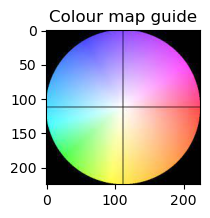

In [17]:
#define a function to visualize the flow anf the corresponding images
def flow_visualization(estimated_flow_numpy, image_1_numpy, image_2_numpy):
    #visualize the flow
    #we will plot the flow image as per th imported function flow_to_image
    #it returns an image that is visualizing the flow
    flow_image = flow_to_image(estimated_flow_numpy)


    fig, ax = plt.subplots(1, 3, figsize=(15, 15))
    ax[0].imshow(image_1_numpy)
    ax[0].set_title('First frame')
    ax[1].imshow(image_2_numpy)
    ax[1].set_title('Second frame')
    ax[2].imshow(flow_image)
    ax[2].set_title('Estimated flow')
    plt.show()

#also plot the colour map guide
#this is a small image that shows the colour map guide, plot after the figure
#in same row
#plot a small image
#just one image in figure
#we load the colour map guide image
colour_map_guide = read_image(PATH_TO_COLOR_MAP_GUIDE).astype(np.uint8)
fig, ax = plt.subplots(1, 1, figsize=(2, 2))
ax.imshow(colour_map_guide)
ax.set_title('Colour map guide')
plt.show()



In [18]:
#function to plot images 
#we would be given a list of images
#and a list of titles
#we will create a figure with number of rows and columns
#and plot the images in the figure
def plot_images(images, titles ,rows =None ):
    #we will assume that the number of images is equal to the number of titles
    #but check if the number of images is equal to the number of titles
    if len(images) != len(titles):
        raise ValueError('The number of images and titles should be equal !')
    #we will check if parameter rows is apssed or not
    #if not passed we then assume 1 row and number of columns equal to number of images
    if rows is None:
        rows = 1
        columns = len(images)
    else:
        #else we will have 5 images in each row
        columns = 5
        #calculate rows
        #rows is ceil of number of images divided by 5
        rows = math.ceil(len(images)/columns)
    #create a figure with all the images as subplots
    fig, ax = plt.subplots(rows, columns, figsize=(20, 20))
    #we will iterate over all the images
    for i in range(len(images)):
        #get the row and column number
        row = i//columns
        column = i%columns
        #plot the image
        ax[i].imshow(images[i])
        #set the title
        ax[i].set_title(titles[i])
    plt.show()
    

    

In [19]:
#function to return SSIM, MS SSIM , LPIPS , PSNR 
#  LPIPS :A low -> perceptual similar.
# PSNR : High -> perceptual similar.
# SSIM : High -> perceptual similar.
# MS SSIM : High -> perceptual similar.
# which is a value between -1 and +1. A value of +1 indicates that the 2 given images are very similar or the same while a value of -1 indicates the 2 given images are very different.
#on the pair of images
def get_metrics(image_1, image_2):
    #we will convert the images to tensor
    image_1 = torch.from_numpy(image_1).permute(2, 0, 1).unsqueeze(0)
    image_2 = torch.from_numpy(image_2).permute(2, 0, 1).unsqueeze(0)
    #we will convert the images to float
    image_1 = image_1.float()
    image_2 = image_2.float()
    #we will convert the images to cuda
    image_1 = image_1.to(device)
    image_2 = image_2.to(device)
    #if the range of the images is 0 to 255, then we will convert it to 0 to 1
    if image_1.max() > 1:
        image_1 = image_1/255
    if image_2.max() > 1:
        image_2 = image_2/255
    # #we will convert the images to range 0 to 1
    # image_1 = image_1/255
    # image_2 = image_2/255
    #we will calculate the SSIM using the library imported sklearn
    # ssim_val = ssim(image_1, image_2, data_range=1, multichannel=True)
    #we will calculate the MS SSIM using the library imported pytorch_msssim

    #first compute the SSIM
    #create an instance of StructuralSimilarityIndexMeasure
    ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    #compute the SSIM
    ssim_val = ssim(image_1, image_2)
    #compute the MS SSIM
    ms_ssim = MultiScaleStructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    ms_ssim_val = ms_ssim(image_1, image_2)
    #we will calculate the LPIPS using the library imported pytorch_msssim
    lpips = LearnedPerceptualImagePatchSimilarity(net_type='vgg',weights='VGG16_Weights.DEFAULT').to(device)
    lpips_val = lpips(image_1, image_2)

    #psnr
    psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
    psnr_val = psnr(image_1, image_2)

    #we will calculate Universal Image Quality Index
    # uqi = UniversalImageQualityIndex(data_range=1.0).to(device)
    # uqi_val = uqi(image_1, image_2)

    #we will also calculate MSE
    mse = MeanSquaredError(data_range=1.0).to(device)
    mse_val = mse(image_1, image_2)
    

    #convert all tensors to numpy array in cpu and return
    #use .detach().cpu().numpy()
    return ssim_val.detach().cpu().numpy(), ms_ssim_val.detach().cpu().numpy(), lpips_val.detach().cpu().numpy(), psnr_val.detach().cpu().numpy(),  mse_val.detach().cpu().numpy()


    #we return the SSIM, MS SSIM , LPIPS , PSNR
    # return ssim_val, ms_ssim_val, lpips_val, psnr_val

    

        
    
        
    


In [20]:
#test the function
def test_metrics():
    #we will load the images
    image_1 = read_image(PATH_TO_IMAGE_1).astype(np.uint8)
    image_2 = read_image(PATH_TO_IMAGE_2).astype(np.uint8)
    #print the shape of the images

    #get the metrics
    ssim_val, ms_ssim_val, lpips_val, psnr_val, mse_val = get_metrics(image_2, image_2)
    #print the metrics
    print('SSIM : ', ssim_val)
    print('MS SSIM : ', ms_ssim_val)
    print('LPIPS : ', lpips_val)
    print('PSNR : ', psnr_val)
    # print('UQI : ', uqi_val)
    print('MSE : ', mse_val)

#test the function
test_metrics()

/home/lisa/anaconda3/envs/pytorch/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/lisa/anaconda3/envs/pytorch/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SSIM :  1.0
MS SSIM :  1.0
LPIPS :  0.0
PSNR :  inf
MSE :  0.0


In [21]:
#function to build the model
#we will use the pretrained model from
# select_model is defined as:
# Select, construct and load model
#     input parameters:
#         MODEl_NAME
#         pre_trained_model_type
#         global_optim_iter
#         local_optim_iter
#         path_to_pre_trained_models
#     output:
#         network: constructed and loaded network

#we will use PDCNet_plus as the model name
#pre_trained_model_type is set to chairs_things_ft_sintel


def build_model(image_1, image_2, target_image_shape, args):
    
    with torch.no_grad():
        #convert the frames to tensor
        #save the images as image_1_numpy and image_2_numpy, converting to uint8
        image_1_numpy = image_1.astype(np.uint8)
        image_2_numpy = image_2.astype(np.uint8)
        image_1 = torch.from_numpy(image_1).permute(2, 0, 1).unsqueeze(0)
        image_2 = torch.from_numpy(image_2).permute(2, 0, 1).unsqueeze(0)


        network, estimate_uncertainty = select_model( MODEL_NAME= args.model , pre_trained_model_type=args.pre_trained_model, arguments=args , global_optim_iter=args.optim_iter, local_optim_iter=args.local_optim_iter)
        #call read frames to read the two frames
        # image_1, image_2, first_image_shape = read_frames(PATH_TO_IMAGE_1, PATH_TO_IMAGE_2)
        if estimate_uncertainty:
            if args.flipping_condition:
                raise NotImplementedError('No flipping condition with PDC-Net for now')
            
            #print in the if condition
            print('inside if condition' , 'estimate_uncertainty is ', estimate_uncertainty, 'args.flipping_condition is ', args.flipping_condition)

            estimated_flow, uncertainty_components = network.estimate_flow_and_confidence_map(image_1,image_2, mode='channel_first')
            confidence_map = uncertainty_components['p_r'].squeeze().detach().cpu().numpy()
             #
            # #
            # #we will print the shapes of the estimated flow and the confidence map and the images
            # print('estimated_flow shape: ', estimated_flow.shape)
            # print('confidence_map shape: ', confidence_map.shape)
            # print('image_1 shape: ', image_1.shape)
            # print('image_2 shape: ', image_2.shape)
            # #
            # #

            confidence_map = confidence_map[:target_image_shape[0], :target_image_shape[1]]
        else:

            #print in the else condition
            print('inside else condition' , 'estimate_uncertainty is ', estimate_uncertainty, 'args.flipping_condition is ', args.flipping_condition)
            if args.flipping_condition and 'GLUNet' in args.model:
                estimated_flow = network.estimate_flow_with_flipping_condition(image_1, image_2,
                                                                            mode='channel_first')
                #print in the else condition
                print('inside else - if condition' , 'estimate_uncertainty is ', estimate_uncertainty, 'args.flipping_condition is ', args.flipping_condition)
            else:
                estimated_flow = network.estimate_flow(image_1, image_2, mode='channel_first')
                #print in the else condition
                print('inside else - else condition' , 'estimate_uncertainty is ', estimate_uncertainty, 'args.flipping_condition is ', args.flipping_condition)
        
                
        

        
        estimated_flow_numpy = estimated_flow.squeeze().permute(1, 2, 0).cpu().numpy()

        # #
        # #
        # #we will print the shapes of the estimated flow and the confidence map and the images
        # print('estimated_flow shape: ', estimated_flow.shape)
        # print('confidence_map shape: ', confidence_map.shape)
        # print('image_1 shape: ', image_1.shape)
        # print('image_2 shape: ', image_2.shape)
        # #
        # #


        estimated_flow_numpy = estimated_flow_numpy[:target_image_shape[0], :target_image_shape[1]]       ## to do 
        # removes the padding

        #we warp the image 1 to image 2 using the estimated flow, and call it warped image
        warped_image = remap_using_flow_fields(image_1_numpy, estimated_flow_numpy[:, :, 0],
                                                        estimated_flow_numpy[:, :, 1]).astype(np.uint8)

        # now we predict the third frame by using the second frame as source and warping it using the estimated flow
        #we are assuming linear motion, thus the optical flow is the same for the second and third frame
        predicted_image = remap_using_flow_fields(image_2_numpy, estimated_flow_numpy[:, :, 0],
           
                                                         estimated_flow_numpy[:, :, 1]).astype(np.uint8) 
    

    # return estimated_flow_numpy, confidence_map, warped_image, predicted_image
        #return on if confidence map is not none
    # if confidence_map is None:
    #     return estimated_flow_numpy
        #if confidence map is not assigned to anything, return the estimated flow
    try:
        return estimated_flow_numpy, confidence_map, warped_image, predicted_image, image_1_numpy, image_2_numpy
    except:
        return estimated_flow_numpy, None, warped_image, predicted_image, image_1_numpy, image_2_numpy

    # return estimated_flow_numpy, confidence_map

    


In [22]:
# now we will define a function to call the build model function and display the results, plot the confidence map and display the warped and predicted images
def display_results(model = MODEL_NAME, pre_trained_model = PRE_TRAINED_MODEL, optim_iter = OPTIM_ITER, local_optim_iter = LOCAL_OPTIM_ITER, flipping_condition = FLIPPING_CONDITION, plot= True, img_pth_1 = PATH_TO_IMAGE_1, img_pth_2 = PATH_TO_IMAGE_2):
    #build args
    args = Args(model= model, pre_trained_model= pre_trained_model, optim_iter= optim_iter, local_optim_iter= local_optim_iter, flipping_condition= flipping_condition)

    #read the two frames
    image_1, image_2, target_image_shape = read_frames(img_pth_1, img_pth_2)

    # estimated_flow_numpy, confidence_map, warped_image, predicted_image = build_model(image_1, image_2, target_image_shape , args)
    estimated_flow_numpy, confidence_map, warped_image, predicted_image,  image_1_numpy, image_2_numpy = build_model(image_1, image_2, target_image_shape , args)

    if plot:
        #we visualize the flow, call flow_visualization
        flow_visualization(estimated_flow_numpy, image_1_numpy, image_2_numpy)

        #we will now plot the confidence map
        #confidence map 


    return estimated_flow_numpy, confidence_map, warped_image, predicted_image, image_1_numpy, image_2_numpy

Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False


/home/lisa/anaconda3/envs/pytorch/lib/python3.8/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(
/home/lisa/anaconda3/envs/pytorch/lib/python3.8/site-packages/cupy/cuda/compiler.py:461: UserWarning: cupy.cuda.compile_with_cache has been deprecated in CuPy v10, and will be removed in the future. Use cupy.RawModule or cupy.RawKernel instead.
  warnings.warn(


inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False


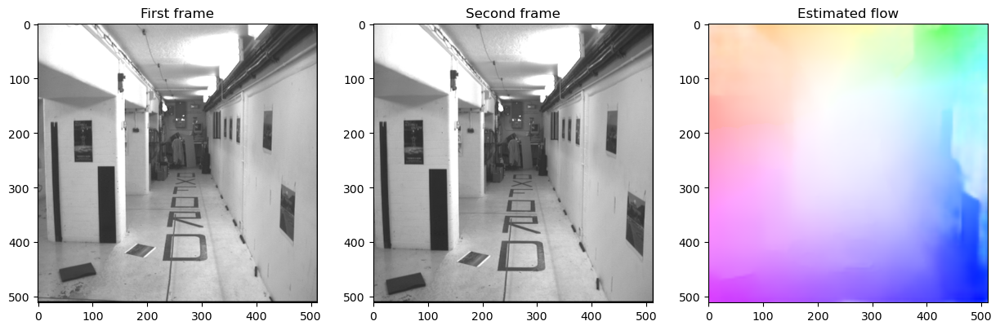

In [23]:
#call the display results function
estimated_flow_numpy, confidence_map, warped_image, predicted_image, image_1_numpy, image_2_numpy = display_results()

In [24]:
#get the dimenssion of the flow
print('estimated_flow_numpy shape: ', estimated_flow_numpy.shape)
#get type of the flow
print('estimated_flow_numpy type: ', type(estimated_flow_numpy))
#get datatype of the flow
print('estimated_flow_numpy datatype: ', estimated_flow_numpy.dtype)
#get max and min of the flow
print('estimated_flow_numpy max: ', estimated_flow_numpy.max())
print('estimated_flow_numpy min: ', estimated_flow_numpy.min())
#average of the flow
print('estimated_flow_numpy average: ', estimated_flow_numpy.mean())

estimated_flow_numpy shape:  (512, 512, 2)
estimated_flow_numpy type:  <class 'numpy.ndarray'>
estimated_flow_numpy datatype:  float32
estimated_flow_numpy max:  18.91703
estimated_flow_numpy min:  -31.289228
estimated_flow_numpy average:  -3.2752163


In [25]:
#read image_3
image_3 = read_image(PATH_TO_IMAGE_3).astype(np.uint8)

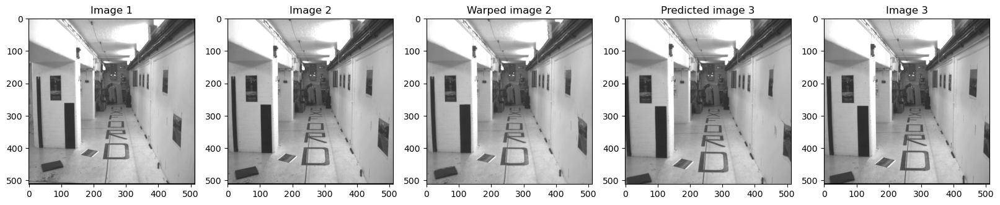

In [26]:
#test plot_images function
#create a list of images
images = [image_1_numpy, image_2_numpy, warped_image, predicted_image, image_3]
titles = ['Image 1', 'Image 2', 'Warped image 2', 'Predicted image 3', 'Image 3']
plot_images(images, titles)


In [27]:
#get the type of the estimated_flow_numpy
print('type of estimated_flow_numpy is ', type(estimated_flow_numpy))
#shape
print('shape of estimated_flow_numpy is ', estimated_flow_numpy.shape)
# get the datatype of the estimated_flow_numpy
print('datatype of estimated_flow_numpy is ', estimated_flow_numpy.dtype)
#print the estimated_flow_numpy
print('estimated_flow_numpy is ', estimated_flow_numpy)


type of estimated_flow_numpy is  <class 'numpy.ndarray'>
shape of estimated_flow_numpy is  (512, 512, 2)
datatype of estimated_flow_numpy is  float32
estimated_flow_numpy is  [[[  5.1156416   4.1710434]
  [  5.1156416   4.1710434]
  [  5.2360277   4.3169146]
  ...
  [-15.13478     6.071082 ]
  [-14.924445    5.9349785]
  [-14.924445    5.9349785]]

 [[  5.1156416   4.1710434]
  [  5.1156416   4.1710434]
  [  5.2360277   4.3169146]
  ...
  [-15.13478     6.071082 ]
  [-14.924445    5.9349785]
  [-14.924445    5.9349785]]

 [[  5.2645392   4.305044 ]
  [  5.2645392   4.305044 ]
  [  5.3820443   4.438784 ]
  ...
  [-15.355144    6.1469746]
  [-15.169141    6.0166903]
  [-15.169141    6.0166903]]

 ...

 [[ 18.527     -20.54847  ]
  [ 18.527     -20.54847  ]
  [ 18.55239   -20.67781  ]
  ...
  [-19.668835  -24.32646  ]
  [-19.312462  -23.92281  ]
  [-19.312462  -23.92281  ]]

 [[ 18.465866  -20.315287 ]
  [ 18.465866  -20.315287 ]
  [ 18.506145  -20.46467  ]
  ...
  [-19.199163  -23.862253

In [28]:

#first check if confidence_map is not none
if confidence_map is not None:
    #get the type of the confidence_map
    print('type of confidence_map is ', type(confidence_map))
    #shape
    print('shape of confidence_map is ', confidence_map.shape)
    # get the datatype of the confidence_map
    print('datatype of confidence_map is ', confidence_map.dtype)
    #print the confidence_map
    print('confidence_map is ', confidence_map)
else:
    print('confidence_map is None')

confidence_map is None


In [29]:
#define a function to return both optical flows: deep network flow and classical flow
def return_both_flows(path_1, path_2, deep_model = MODEL_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs'):
    #use display results function to get the deep network flow
    estimated_flow_numpy, confidence_map, deep_warped_image, deep_predicted_image, image_1_numpy, image_2_numpy = display_results(model = deep_model, pre_trained_model = deep_pre_trained_model, plot= False, img_pth_1 = path_1, img_pth_2 = path_2)
    
    if classical_model == 'hs':
        #now horn schunck flow
        classical_flow = horn_schunk_flow(path_1, path_2)
    else:
        classical_flow = lukas_kanade_flow(path_1, path_2)



    return estimated_flow_numpy, classical_flow , deep_warped_image, deep_predicted_image

In [30]:
#test the function return_both_flows
def test_return_both_flows():
    #define the paths
    path_1 = PATH_TO_IMAGE_1
    path_2 = PATH_TO_IMAGE_2

    #call the function
    estimated_flow_numpy, classical_flow , deep_warped_image, deep_predicted_image = return_both_flows(path_1, path_2)

    #plot the results
    #create a list of images
    # images = [image_1_numpy, image_2_numpy, deep_warped_image, deep_predicted_image]
    # titles = ['Image 1', 'Image 2', 'Deep network warped image 2', 'Deep network predicted image 3']
    # plot_images(images, titles)

    # #plot the classical flow
    # flow_visualization(classical_flow, image_1_numpy, image_2_numpy)

    # #plot the deep network flow
    # flow_visualization(estimated_flow_numpy, image_1_numpy, image_2_numpy)
    #print values of estimated_flow_numpy
    print('estimated_flow_numpy is ', estimated_flow_numpy)
    #max value of estimated_flow_numpy, min, mean
    print('estimated_flow_numpy max: ', estimated_flow_numpy.max())
    print('estimated_flow_numpy min: ', estimated_flow_numpy.min())
    print('estimated_flow_numpy mean: ', estimated_flow_numpy.mean())

    #print datatype
    print('estimated_flow_numpy datatype: ', estimated_flow_numpy.dtype)
    #print shape
    print('estimated_flow_numpy shape: ', estimated_flow_numpy.shape)
    #type
    print('estimated_flow_numpy type: ', type(estimated_flow_numpy))

#call
test_return_both_flows()

Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
estimated_flow_numpy is  [[[  5.1157055   4.1709347]
  [  5.1157055   4.1709347]
  [  5.2360864   4.316807 ]
  ...
  [-15.134811    6.0707054]
  [-14.924493    5.934582 ]
  [-14.924493    5.934582 ]]

 [[  5.1157055   4.1709347]
  [  5.1157055   4.1709347]
  [  5.2360864   4.316807 ]
  ...
  [-15.134811    6.0707054]
  [-14.924493    5.934582 ]
  [-14.924493    5.934582 ]]

 [[  5.2646055   4.3049364]
  [  5.2646055   4.3049364]
  [  5.3821054   4.4386773]
  ...
  [-15.355175    6.1465893]
  [-15.169188    6.016286 ]
  [-15.169188    6.016286 ]]

 ...

 [[ 18.526592  -20.54837  ]
  [ 18.526592  -20.54837  ]
  [ 18.55195   -20.677692 ]
  ...
  [-19.668585  -24.325876 ]
  [-19.31219   -23.922213 ]
  [-19.31219   -23.922213 ]]

 [[ 18.46544   -20.31519  ]

In [31]:
import fnmatch
#we will now compare the optical flow by deep neural networks with the classical optical flow methods
#this function compares the prediction of both and plots the two frames and the two optical flows
#in the next row the 3 imaages, actual 3rd frame, predicted 3 frame using both flows
def compare_optical_flow(path_1, path_2, path_3, deep_model = MODEL_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs'):
    #nooffiles=len(fnmatch.filter(os.listdir(r'path'), '*.*'))
    #use the function return_both_flows to get the two flows
    
    estimated_flow_numpy, classical_flow , deep_warped_image, deep_predicted_image= return_both_flows(path_1, path_2,  deep_model = deep_model, deep_pre_trained_model = deep_pre_trained_model, classical_model = classical_model)
    print(path_1)
    #load all 3 images
    image_1 = read_image(path_1).astype(np.uint8)
    image_2 = read_image(path_2).astype(np.uint8)
    image_3 = read_image(path_3).astype(np.uint8)

    #now we wrap the classical flow, first we warap of to first frame to get the warped image
    wraped_classical_flow = remap_using_flow_fields(image_1,classical_flow[:,:,0], classical_flow[:,:,1]).astype(np.uint8)
    #now we warp the second frame to get the predicted image
    predicted_classical_flow = remap_using_flow_fields(image_2,classical_flow[:,:,0], classical_flow[:,:,1]).astype(np.uint8)

    #now we plot the images
    #first figure contains image 1 and image 2 and the optical flow visualization of the deep network and the classical flow
    #plot figure 1
    fig = plt.figure(figsize=(20, 20))
    #plot image 1
    ax1 = fig.add_subplot(1,4,1)
    ax1.imshow(image_1)
    ax1.set_title('Frame 1')
    #plot image 2
    ax2 = fig.add_subplot(1,4,2)
    ax2.imshow(image_2)
    ax2.set_title('Frame 2')
    #plot optical flow visualization of the deep network
    ax3 = fig.add_subplot(1,4,3)
    ax3.imshow(flow_to_image(estimated_flow_numpy))
    ax3.set_title('Deep network optical flow')
    #plot optical flow visualization of the classical flow
    ax4 = fig.add_subplot(1,4,4)
    ax4.imshow(flow_to_image(classical_flow))
    ax4.set_title('Classical optical flow')


    #now we plot the second figure
    #this figure contains the actual 2nd frame, the predicted 2nd frame using deep network flow, the warped 2nd frame using classical flow
    #plot figure 2
    fig = plt.figure(figsize=(20, 20))
    #plot image 2
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(image_2)
    ax1.set_title('Frame 2')
    #plot predicted 2nd frame using deep network flow
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.imshow(deep_warped_image)
    ax2.set_title('2nd frame deep network')
    #plot warped 2nd frame using classical flow
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(wraped_classical_flow)
    ax3.set_title('2nd frame classical flow')

    #now we plot the third figure
    #in this we plot the actual 3rd frame, the predicted 3rd frame using deep network flow, the predicted 3rd frame using classical flow
    #plot figure 3
    fig = plt.figure(figsize=(20, 20))
    #plot image 3

    ax1 = fig.add_subplot(1, 3, 1)
    ax1.imshow(image_3)
    ax1.set_title('Frame 3')
    #plot predicted 3rd frame using deep network flow
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.imshow(deep_predicted_image)
    ax2.set_title('3rd frame deep network')
    #plot predicted 3rd frame using classical flow
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.imshow(predicted_classical_flow)
    ax3.set_title('3rd frame classical flow')

    #now show the figures
    plt.show()

    
    # we will now print the metrics of the two sets of generated images, frame 2 and frame 3
    #first we will print the metrics of the frame 2
    print('Metrics for frame 2: most reliable indicator of OF')
    #print a table
    # print(tabulate([['Deep network', psnr(image_2, deep_warped_image), ssim(image_2, deep_warped_image), mse(image_2, deep_warped_image)], ['Classical', psnr(image_2, wraped_classical_flow), ssim(image_2, wraped_classical_flow), mse(image_2, wraped_classical_flow)]], headers=['Method', 'PSNR', 'SSIM', 'MSE']))
    #create 2 rows : one for deep network and one for classical
    #create 5 columns : one for method name, one for psnr, one for ssim, one for mse , one for lpips
    
    table_2 = np.zeros((2,5))
    #fill the first row with deep network values
    #call function  get_metrics to get all the metrics
    table_2[0,:] = get_metrics(deep_warped_image,image_2)
    #fill the second row with classical values
    table_2[1,:] = get_metrics( wraped_classical_flow, image_2)

    
    #now label the rows and columns
    row_labels = ['Deep network', 'Classical']
    column_labels = ['Method', 'SSIM', 'MS SSIM' , 'LPIPS', 'PSNR', 'MSE']
    #now print the table
    print(tabulate(table_2, headers=column_labels, showindex=row_labels))
    #store the metrics in a dictionary
    metrics_optical_flow = {'SSIM': table_2[:,0], 'MS SSIM': table_2[:,1], 'LPIPS': table_2[:,2], 'PSNR': table_2[:,3], 'MSE': table_2[:,4]}
    #now we will print the metrics of the frame 3
    print('Metrics for frame 3: Predicted Frame')
    table_3 = np.zeros((2,5))
    #fill the first row with deep network values
    table_3[0,:] = get_metrics( deep_predicted_image, image_3)
    #fill the second row with classical values
    table_3[1,:] = get_metrics( predicted_classical_flow, image_3)
    #now print the table
    print(tabulate(table_3, headers=column_labels, showindex=row_labels))
    #store the metrics in a dictionary
    metrics_predicted_frame = {'SSIM': table_3[:,0], 'MS SSIM': table_3[:,1], 'LPIPS': table_3[:,2], 'PSNR': table_3[:,3], 'MSE': table_3[:,4]}
    
    #return the two dictionaries
    return metrics_optical_flow, metrics_predicted_frame, table_2, table_3













In [32]:
#compare_optical_flow(PATH_TO_IMAGE_1, PATH_TO_IMAGE_2, PATH_TO_IMAGE_3, deep_model = MODEl_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs')

Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.000.pgm


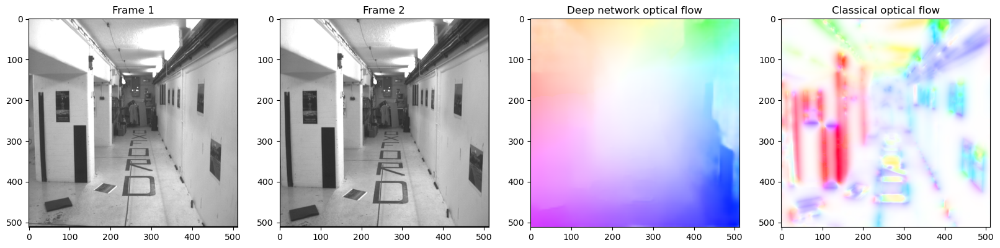

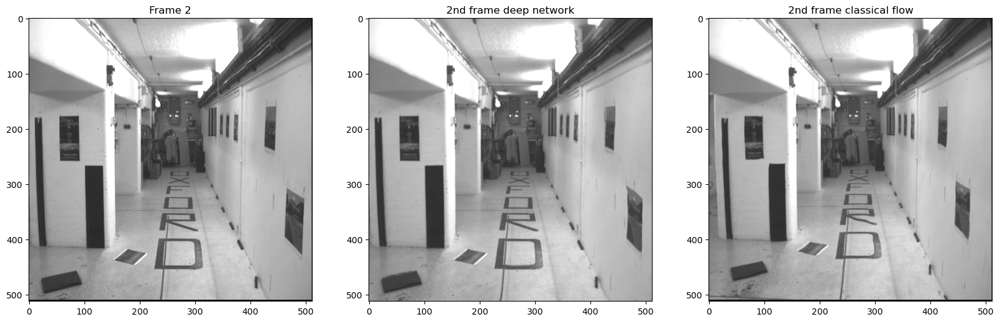

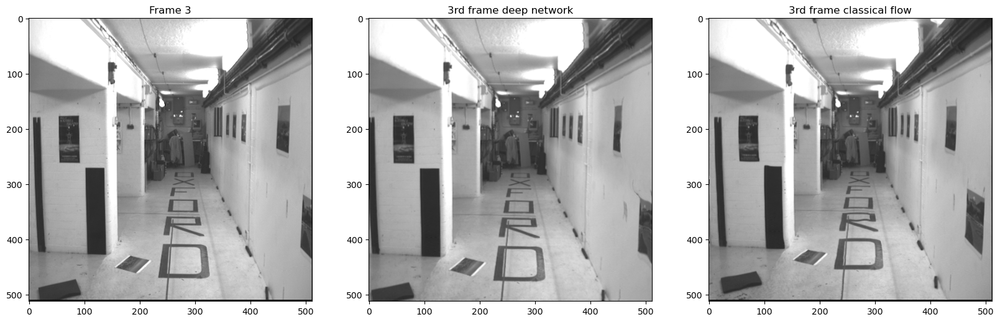

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.92558    0.976107  0.13525   24.1486  0.00384715
Classical     0.649664   0.671432  0.260868  17.3148  0.0185574
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.564479   0.564662  0.306939  15.9836  0.0252141
Classical     0.573465   0.555984  0.305927  16.5137  0.0223169
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.001.pgm


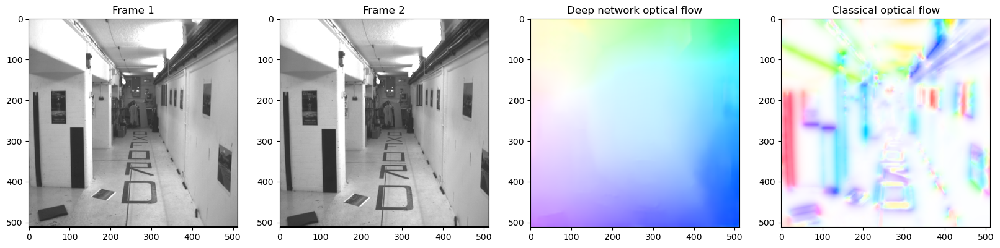

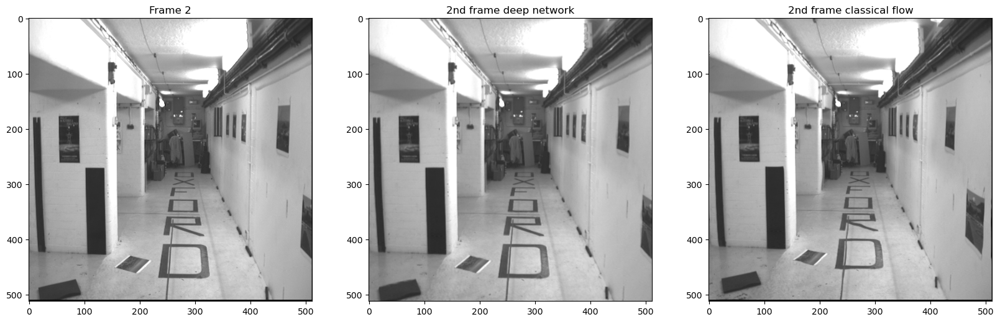

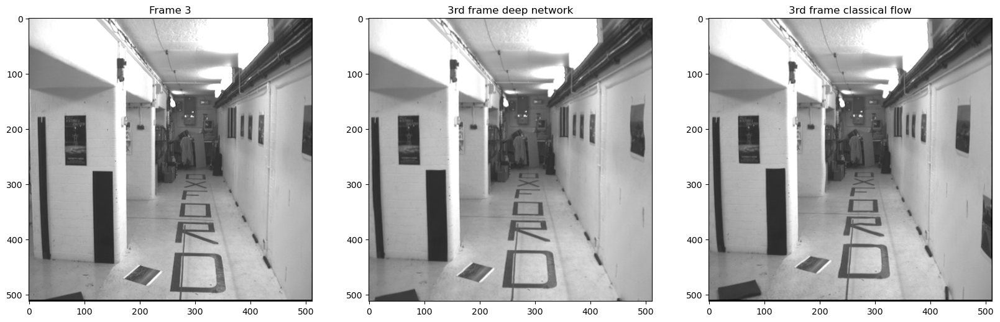

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.947977   0.986826  0.110432  25.9849  0.00252062
Classical     0.62298    0.616783  0.281594  17.5427  0.0176087
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.522733   0.417979  0.372593  14.3454  0.0367669
Classical     0.492074   0.31621   0.422006  13.5184  0.0444799
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.002.pgm


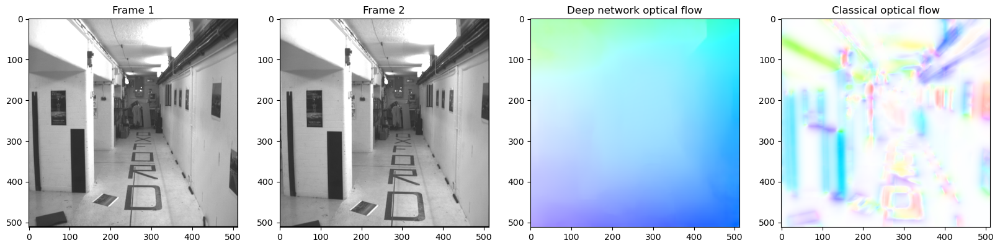

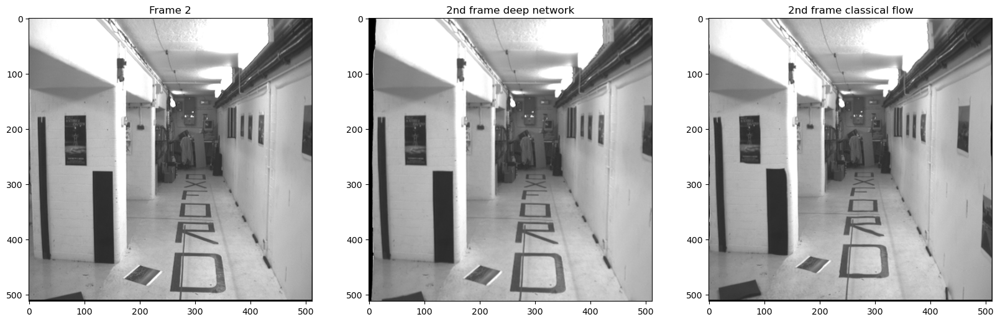

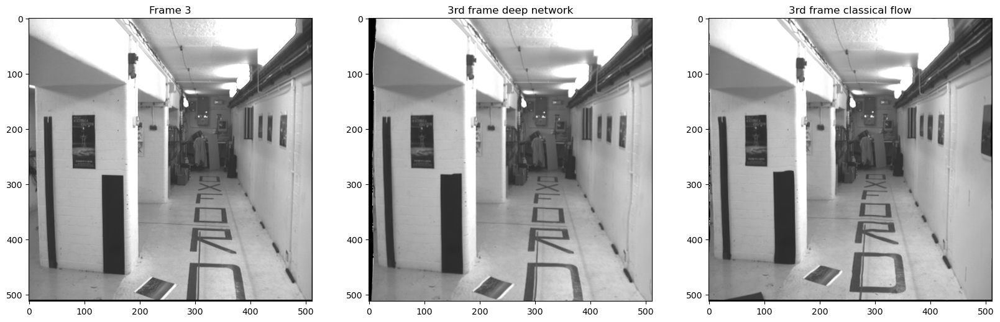

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.932193   0.981377  0.121275  20.8539  0.00821498
Classical     0.511554   0.357003  0.412417  14.0965  0.0389358
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.683752   0.808072  0.210621  18.2881  0.0148317
Classical     0.478829   0.267826  0.445738  12.863   0.051725
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.003.pgm


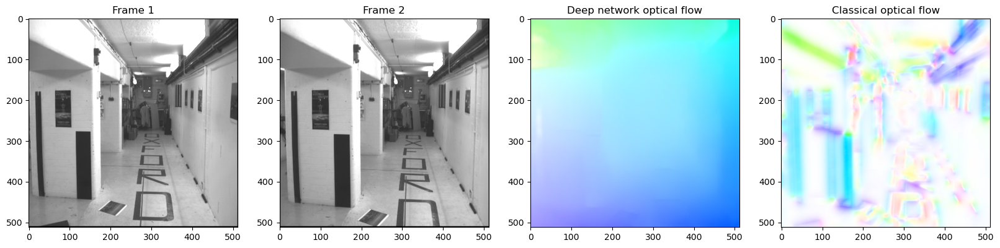

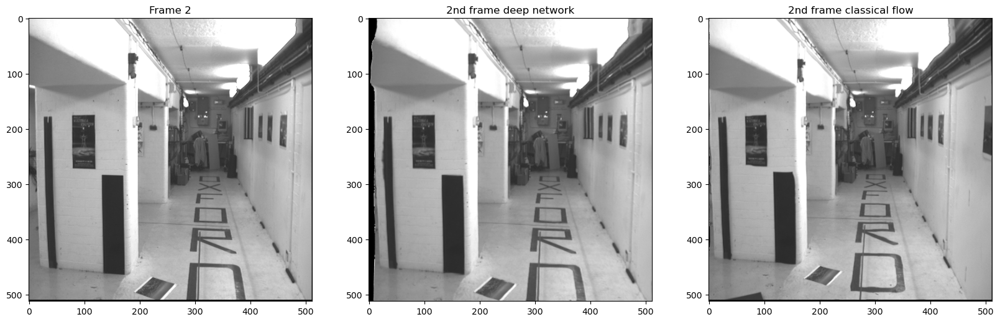

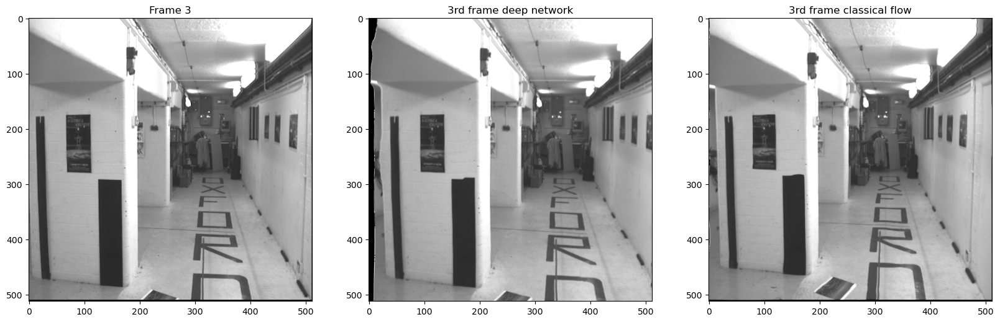

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.925781   0.980346  0.126113  20.9759  0.00798741
Classical     0.491088   0.297049  0.437152  13.2395  0.0474297
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.491052   0.264345  0.449462  12.0733  0.0620395
Classical     0.55207    0.557278  0.314575  15.7118  0.0268421
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.004.pgm


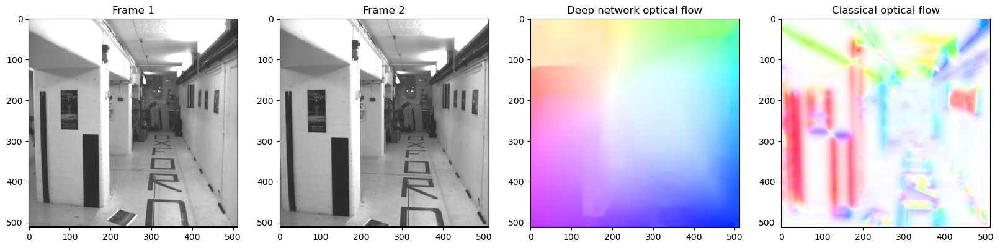

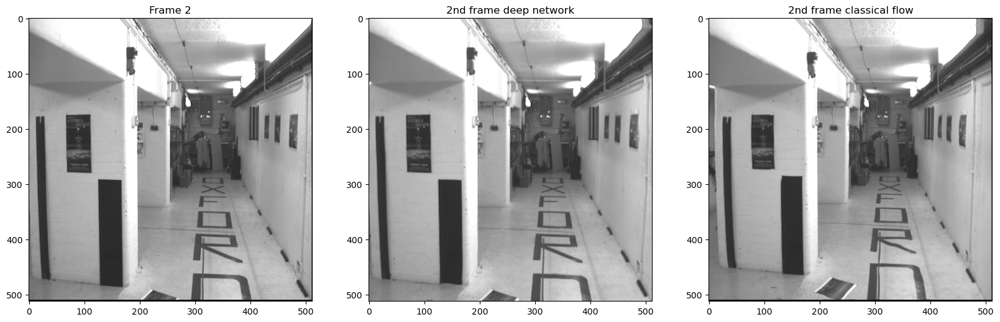

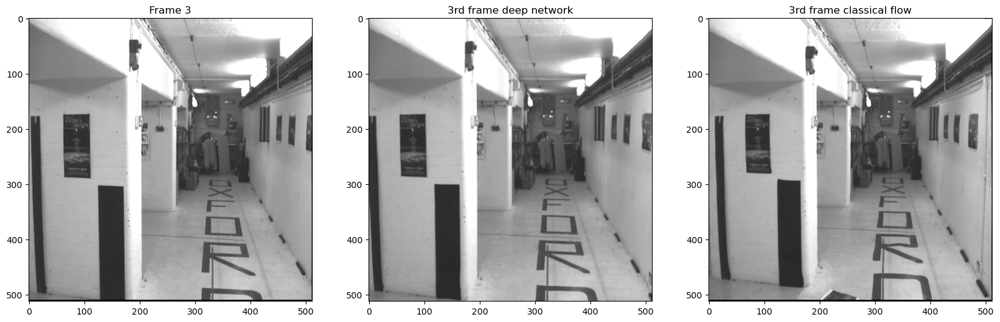

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.930681   0.98303   0.126122  24.5671  0.00349373
Classical     0.595093   0.632232  0.293629  16.9719  0.0200821
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.591545   0.597089  0.304411  16.3448  0.023202
Classical     0.55485    0.509466  0.356764  15.4862  0.0282732
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.005.pgm


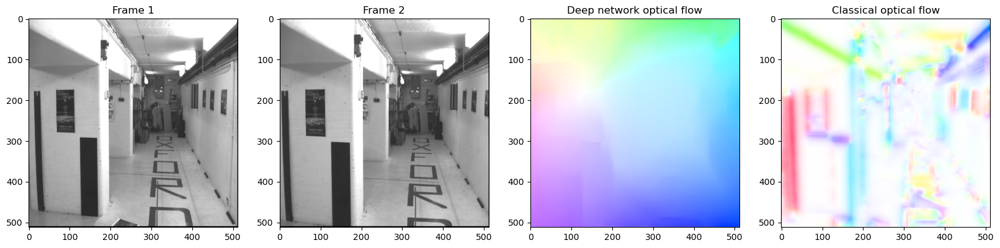

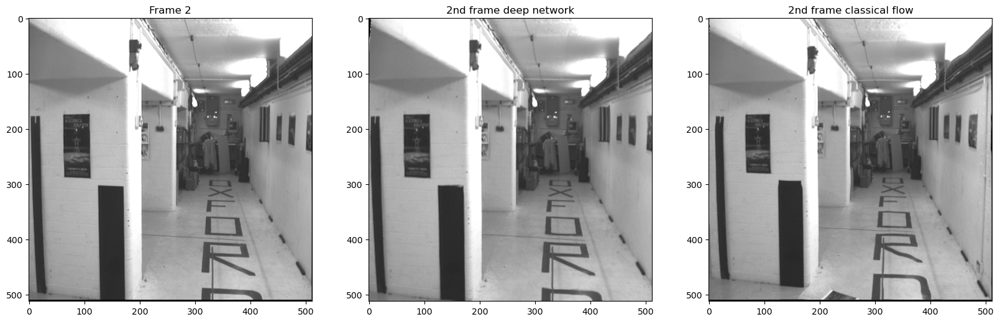

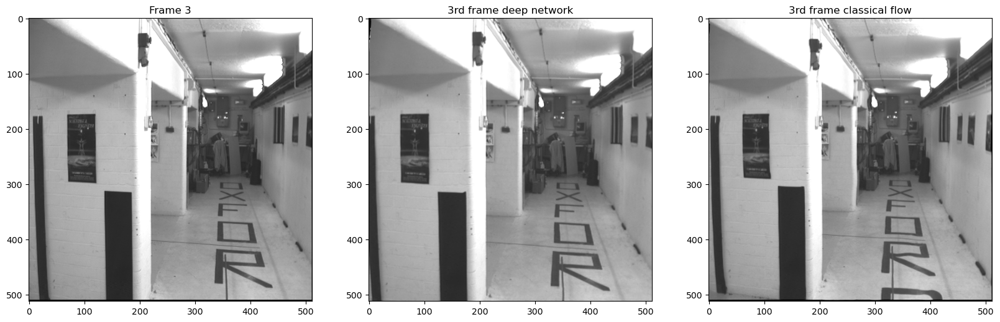

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.936057   0.984323  0.117793  25.2644  0.0029755
Classical     0.58304    0.554738  0.341577  16.1733  0.0241362
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.600126   0.599931  0.304176  15.5643  0.0277694
Classical     0.526336   0.375086  0.398468  13.939   0.0403743
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.006.pgm


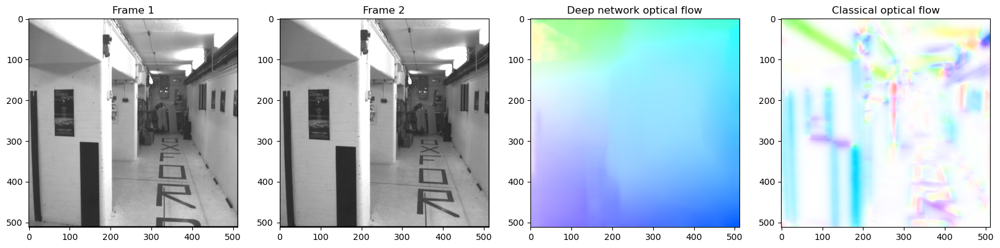

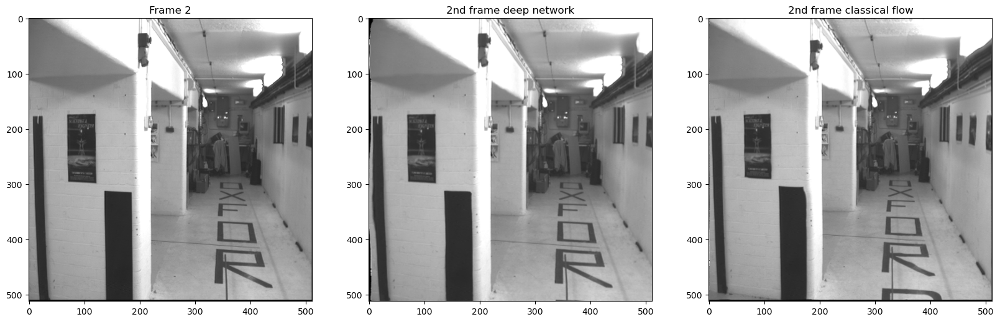

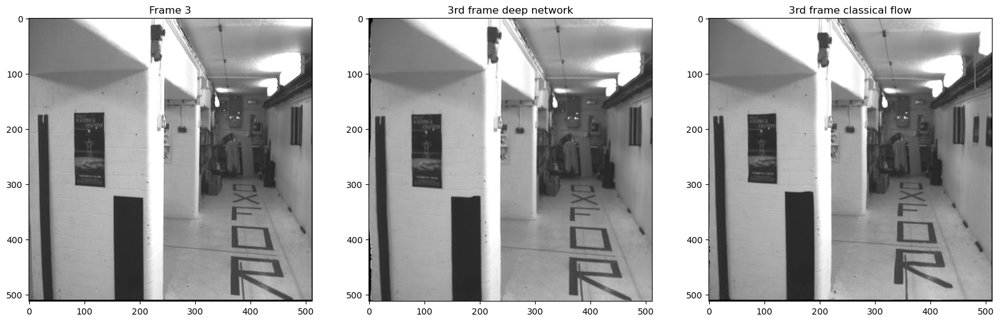

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.940618   0.985034  0.117995  23.3892  0.00458229
Classical     0.553307   0.42327   0.381053  14.6235  0.0344869
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.670131   0.768477  0.24563   18.2713  0.0148892
Classical     0.514781   0.323927  0.426565  13.1359  0.0485746
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.007.pgm


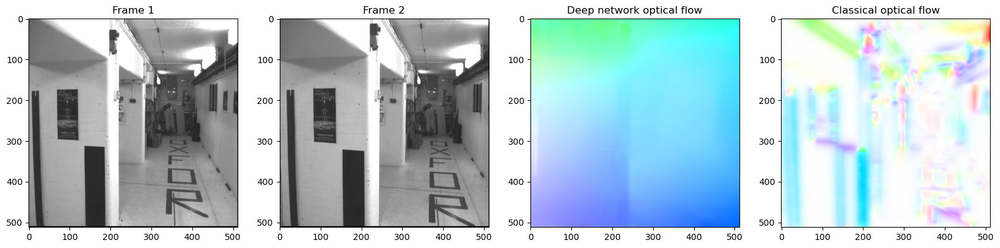

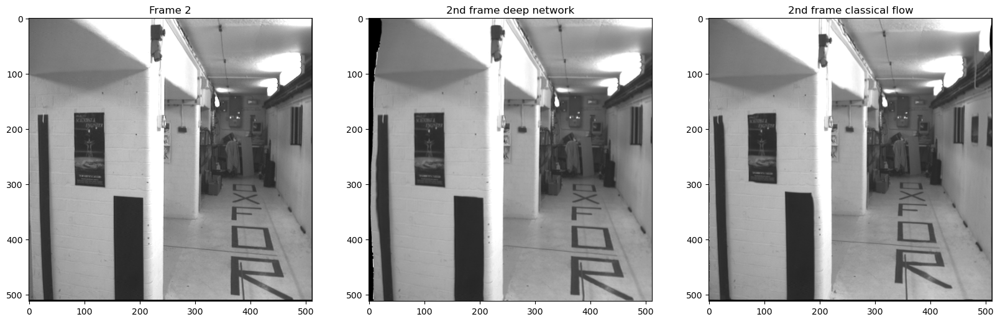

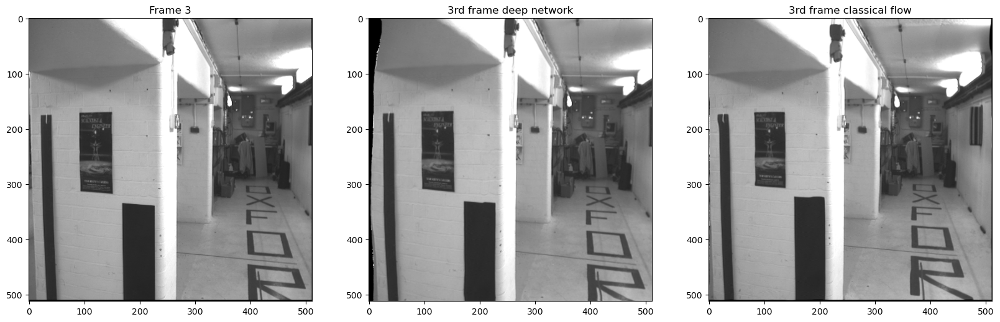

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.923139   0.978644  0.140873  21.4635  0.0071392
Classical     0.5291     0.352345  0.420969  13.5292  0.0443689
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM     LPIPS     PSNR        MSE
------------  --------  ---------  --------  -------  ---------
Deep network  0.793852   0.895941  0.197831  19.8698  0.0103044
Classical     0.53709    0.370095  0.420058  13.3049  0.0467207
Model: PWCNet
Pre-trained-model: chairs_things_ft_sintel
inside else condition estimate_uncertainty is  False args.flipping_condition is  False
inside else - else condition estimate_uncertainty is  False args.flipping_condition is  False
Assignment_datasets/corridor/bt.008.pgm


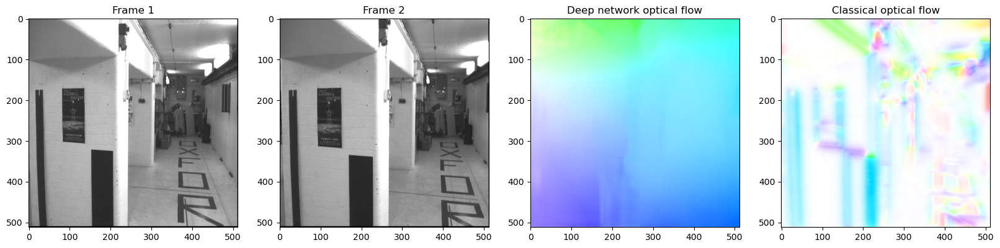

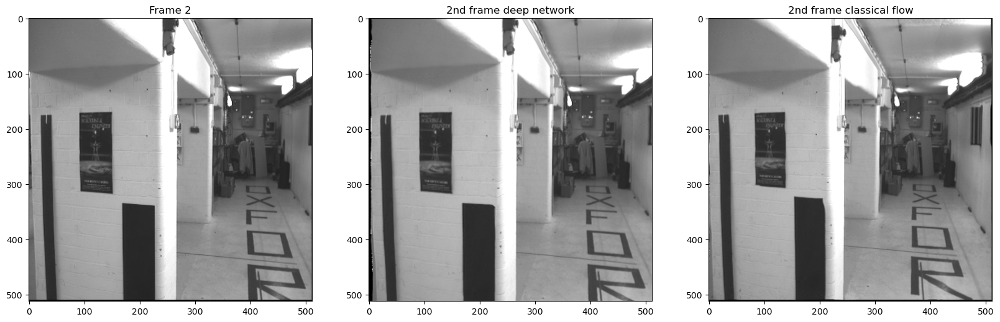

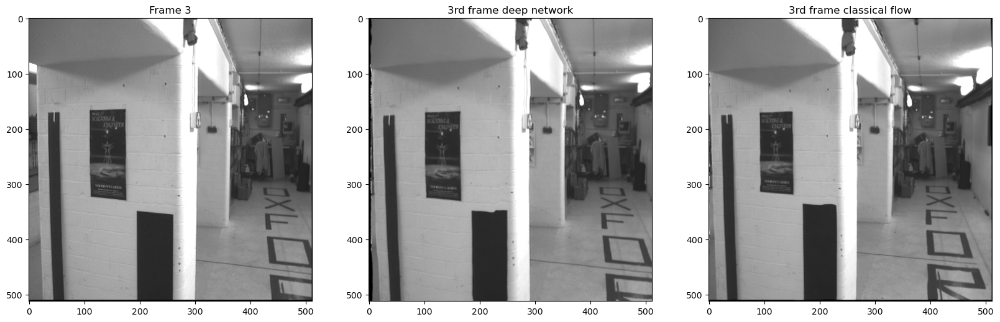

Metrics for frame 2: most reliable indicator of OF
Method            SSIM    MS SSIM     LPIPS     PSNR         MSE
------------  --------  ---------  --------  -------  ----------
Deep network  0.933126   0.983246  0.131414  23.5006  0.00446623
Classical     0.548543   0.394814  0.412606  13.7332  0.0423335
Metrics for frame 3: Predicted Frame
Method            SSIM    MS SSIM    LPIPS     PSNR        MSE
------------  --------  ---------  -------  -------  ---------
Deep network  0.610627   0.582175  0.34836  15.5977  0.027557
Classical     0.511667   0.257918  0.47125  12.1505  0.0609469
Method          Avg SSIM    Avg MS SSIM    Avg LPIPS    Avg PSNR     Avg MSE
------------  ----------  -------------  -----------  ----------  ----------
Deep network    0.932795       0.982103     0.125252     23.3498  0.00502523
Classical       0.56493        0.477741     0.360207     15.2472  0.0319932


In [33]:
#call the function to compare the optical flow


#array=['frames/bt.000.pgm','frames/bt.001.pgm','frames/bt.002.pgm','frames/bt.003.pgm','frames/bt.004.pgm','frames/bt.005.pgm','frames/bt.006.pgm','frames/bt.007.pgm','frames/bt.008.pgm','frames/bt.009.pgm','frames/bt.010.pgm']

def driver():
     
     tab2=[]
     tab3=[]
     for i in range(2,11):
          p_to_1=  'Assignment_datasets/corridor/bt.00'+str(i-2)+'.pgm'
          p_to_2 ='Assignment_datasets/corridor/bt.00'+str(i-1)+'.pgm'
          if i<=9:
               p_to_3 = 'Assignment_datasets/corridor/bt.00'+str(i)+'.pgm'

          else:
               p_to_3 = 'Assignment_datasets/corridor/bt.010.pgm'

          _,_,t2,t3 = compare_optical_flow(p_to_1, p_to_2, p_to_3, deep_model = MODEL_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs')
          tab2.append(t2)
          tab3.append(t3)
          
     tab2_avg = np.zeros((2,5))
     tab3_avg = np.zeros((2,5))

     for i in range(len(tab2)):
          tab2_avg = tab2[i]+tab2_avg
          tab3_avg = tab3[i]+tab3_avg

     row_labels = ['Deep network', 'Classical']
     column_labels = ['Method', 'Avg SSIM', 'Avg MS SSIM' , 'Avg LPIPS', 'Avg PSNR', 'Avg MSE']
     
     print(tabulate(tab2_avg/9, headers=column_labels, showindex=row_labels))
     return None


#create a function for the above code
driver()


In [34]:
# #call the function to compare the optical flow


# #array=['frames/bt.000.pgm','frames/bt.001.pgm','frames/bt.002.pgm','frames/bt.003.pgm','frames/bt.004.pgm','frames/bt.005.pgm','frames/bt.006.pgm','frames/bt.007.pgm','frames/bt.008.pgm','frames/bt.009.pgm','frames/bt.010.pgm']

# def driver():
     
#      tab2=[]
#      tab3=[]
#      for i in range(2,11):
#           p_to_1=  'Assignment_datasets/corridor/bt.00'+str(i-2)+'.pgm'
#           p_to_2 ='Assignment_datasets/corridor/bt.00'+str(i-1)+'.pgm'
#           if i<=9:
#                p_to_3 = 'Assignment_datasets/corridor/bt.00'+str(i)+'.pgm'

#           else:
#                p_to_3 = 'Assignment_datasets/corridor/bt.010.pgm'

#           _,_,t2,t3 = compare_optical_flow(p_to_1, p_to_2, p_to_3, deep_model = MODEl_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs')
#           tab2.append(t2)
#           tab3.append(t3)
          
#      tab2_avg = np.zeros((2,5))
#      tab3_avg = np.zeros((2,5))

#      for i in range(len(tab2)):
#           tab2_avg = tab2[i]+tab2_avg
#           tab3_avg = tab3[i]+tab3_avg

#      row_labels = ['Deep network', 'Classical']
#      column_labels = ['Method', 'Avg SSIM', 'Avg MS SSIM' , 'Avg LPIPS', 'Avg PSNR', 'Avg MSE']
     
#      print(tabulate(tab2_avg/9, headers=column_labels, showindex=row_labels))
#      return None


# #create a function for the above code
# driver()

In [ ]:
# x=np.zeros((2,2))
# y=np.ones((2,2))
# z=np.stack((x,y))
# print((x+y)/2)

In [ ]:
def driver():
     
     tab2=[]
     tab3=[]
     for i in range(0, 17, 1):
          print("index", i, "starting")
          sph = "./Assignment_datasets/sphere/"
          frame1 = str("sphere.") + str(i) + str(".ppm")
          frame2 = str("sphere.") + str(i + 1) + str(".ppm")
          frame3 = str("sphere.") + str(i + 2) + str(".ppm")

          p_to_1 = str(sph) + str(frame1)
          p_to_2 = str(sph) + str(frame2)
          p_to_3 = str(sph) + str(frame3)

          # frame1_img = cv2.imread(frame1_path)
          # frame2_img = cv2.imread(frame2_path)
          # frame3_gt_img = cv2.imread(frame3_gt_path)

          # p_to_1 = cv2.cvtColor(frame1_img, cv2.COLOR_BGR2GRAY)
          # p_to_2 = cv2.cvtColor(frame2_img, cv2.COLOR_BGR2GRAY)
          # p_to_3 = cv2.cvtColor(frame3_gt_img, cv2.COLOR_BGR2GRAY)
          _,_,t2,t3 = compare_optical_flow(p_to_1, p_to_2, p_to_3, deep_model = MODEL_NAME, deep_pre_trained_model = PRE_TRAINED_MODEL, classical_model = 'hs')
          tab2.append(t2)
          tab3.append(t3)
          
     tab2_avg = np.zeros((2,5))
     tab3_avg = np.zeros((2,5))

     for i in range(len(tab2)):
          tab2_avg = tab2[i]+tab2_avg
          tab3_avg = tab3[i]+tab3_avg
     
     row_labels = ['Deep network', 'Classical']
     column_labels = ['Method', 'Avg SSIM', 'Avg MS SSIM' , 'Avg LPIPS', 'Avg PSNR', 'Avg MSE']
     
     print(tabulate(tab2_avg/9, headers=column_labels, showindex=row_labels))
     return None


#create a function for the above code
driver()

index 0 starting


NameError: name 'compare_optical_flow' is not defined

In [ ]:
#let us test horn schunck flow
#give the paths
hs_flow = horn_schunk_flow(PATH_TO_IMAGE_1, PATH_TO_IMAGE_2)

In [ ]:
#plot the flow
#get the dimensions of the flow hs_flow
print('shape of hs_flow is ', hs_flow.shape)
# print('shape of b is ', b.shape)
#get the type of the flow hs_flow
print('type of hs_flow is ', type(hs_flow))
#get min and max of the flow hs_flow
print('min of hs_flow is ', hs_flow.min())
print('max of hs_flow is ', hs_flow.max())
#average of the flow hs_flow
print('average of hs_flow is ', hs_flow.mean())



shape of hs_flow is  (512, 512, 2)
type of hs_flow is  <class 'numpy.ndarray'>
min of hs_flow is  -2.711008861860852
max of hs_flow is  3.3668471160694664
average of hs_flow is  -0.008216821210440397
